## Introduction

This starter code demonstrates how to use load the original ECoG data (i.e. the neural recordings) as well as the model data that, when combined, give the neural flow data. This notebook includes two things:
* how the flow video are created from the data
* how the flow distributions can be evaluated using KL divergende (some inital code)

The code uses many poorly documented classes and functions for loading and processing the data. Typically, you shouldn't be too concerned about whats going on in those functions. The only class that is relevant for you is **FlowLoader**. You don't really have to understand to much of whats going inside its functions, but you should understand the meaning of the input and output parameters.

In [6]:
import numpy as np
import pandas as pd

from preprocess import ECoGPreprocess
from network_flow_models import NetworkFlow, Graph, NetworkAnimation
from matplotlib import pyplot as plt
import networkx as nx
import pickle
import time
import os
from tqdm.notebook import tqdm
from matplotlib import cm
from scipy import stats
import matplotlib.animation as animation
import matplotlib
import seaborn as sns
matplotlib.rcParams['animation.embed_limit'] = 2**128
plt.rcParams["font.family"] = "Times New Roman"
font = {'family' : 'normal',
        'size'   : 22}
matplotlib.rc('font', **font)

In [7]:
# This is only necessary to circumvent a bug in DataSpell, which is the program I use to open jupyter notebooks (https://youtrack.jetbrains.com/issue/DS-3038)
class Results:
   def __init__(self, model_param):
       self.mp = model_param

In [8]:
class FlowLoader:
    def __init__(self, base_path_model, base_path_ecog, session, block_type, block_id):
        """
        :param base_path_model: str
            folder containing the fitted model parameter. The model parameter are stored in a pickle file <session>.pkl
        :param base_path_ecog: str
            folder containing the ECOG data. Each session has its separate folder names <session>
        :param session: str
            name of the session
        :param block_type: str
            'cond', 'rec', or 'test' for conditioning, recording or testing block respectively
        :param block_id: int
            block number. There are 6 blocks each for recording and testing and 5 blocks for conditioning.
        """

        # loading the model parameter for the given session
        self.block_type = block_type
        self.block_id = block_id

        file_name = base_path_model + session + '.pkl'
        with open(file_name, "rb") as input_file:
            model_param_temp = pickle.load(input_file)
        self.model_param = Results(model_param_temp)
        del model_param_temp

        self.graph = self.model_param.mp['graph'] # the graph
        self.B1 = self.graph.B1 # node to incidence matrix
        self.E = self.B1.shape[1] # number of edges
        self.N = self.B1.shape[0] # number of nodes

        # number of frames of flow matrix
        start_idx = self.model_param.mp[block_type][block_id]['start_idx']
        end_idx = self.model_param.mp[block_type][block_id]['end_idx']
        self.T = end_idx[0] - start_idx[0]

        # load the ECoG data
        preprocess = ECoGPreprocess(session, base_path_ecog)
        if block_type == 'cond':
            data = preprocess.load_measurement_block("CondBlock" + str(block_id))
        elif block_type == 'rec':
            data = preprocess.load_measurement_block("RecBlock" + str(block_id))
        else:
            # TODO (Felix): implement for testing blocks
            pass
        self.data_clean = preprocess.remove_bad_channels()

        self.start_idx = self.model_param.mp[block_type][block_id]['start_idx']
        self.end_idx = self.model_param.mp[block_type][block_id]['end_idx']
        self.num_fits = len(start_idx)

        # load the nodes in M1 and S1, respectively
        self.electrode_names = self.model_param.mp['electrode_idx']
        m1_nodes = self.model_param.mp['table_of_experiment']['m1_sites']
        m1_nodes = [int(n) for n in m1_nodes.split(',')]

        self.s1_nodes_good = []
        self.m1_nodes_good = []
        for n in self.electrode_names:
            if self.electrode_names[n] in m1_nodes:
                self.m1_nodes_good.append(n)
            else:
                self.s1_nodes_good.append(n)

        # load location of stimulation
        self.stim1_idx = self.model_param.mp['stim1_idx']
        self.stim2_idx = self.model_param.mp['stim2_idx']

    def get_num_model_fits(self):
        """
        :return: int
            how many times the model has been fitted to within the given block
        """

        return self.num_fits

    def get_single_flow_mtx(self, index):
        """
        :param index: int
             indicates the model fitting instance
        :return: np.ndarray
            2-D numpy array with dimension self.E x self.T. Each column is a single flow snapshot. Each row on the other hand is the flow time series at a single edge.
        """
        data_short = self.data_clean[:,self.start_idx[index]:self.end_idx[index]]
        w1 = self.model_param.mp[self.block_type][self.block_id]['unconstrained']['model_param'][index][self.N:]

        flow = np.dot(np.diag(-w1), np.dot(self.B1.T, data_short))
        return flow

    def generate_animation(self, flow_matrix):
        """
        :param flow_matrix: np.ndarray
            2-D numpy array with dimension self.E x self.T. Each column is a single flow snapshot. Each row on the other hand is the flow time series at a single edge.
        :return: NetworkAnimation
            an instance of NetworkAnimation
        """

        electrode_pos = self.model_param.mp['electrode_pos']

        nf_anim = NetworkAnimation(flow_matrix, graph=self.graph, electrode_pos=electrode_pos, electrode_idx=self.electrode_names, stim1_idx=self.stim1_idx, stim2_idx=self.stim2_idx, m1_nodes=self.m1_nodes_good, s1_nodes=self.s1_nodes_good)

        return nf_anim

    def get_edge_affiliation(self):
        """
        :return: (list, list, list)
            returns indices of (S1, M1, across) edges
        """
        edge_list = self.graph.edge_list

        idx_S1 = []
        idx_M1 = []
        idx_across = []

        for k, e in enumerate(edge_list):
            if e[0] in self.s1_nodes_good and e[1] in self.s1_nodes_good:
                idx_S1.append(k)
            elif e[0] in self.m1_nodes_good and e[1] in self.m1_nodes_good:
                idx_M1.append(k)
            else:
                idx_across.append(k)

        return idx_S1, idx_M1, idx_across

## Generation of Flow Videos

A flow video is just a concatenation of multiple flow snapshots. Each flow snapshot can be stored in a a vector. Therefore, an entire flow video can be represented as a matrix whose columns are the individual flow snapshots.

The flow video generated below represents the average flow during conditioning for a single session.

First load and display the flow for a single trial. if you change the variable *index*, you will probably see significant changes in the flow pattern

In [11]:
# You have to change those paths to where you have stored the data
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'
session = "MonkeyG_20150908_Session2_M1" # the session

# flow matrix for a single trial (here using the 10th instance)
index = 10 # the index of the trail
flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', 1)
flow_mtx_single = flow_loader.get_single_flow_mtx(index)

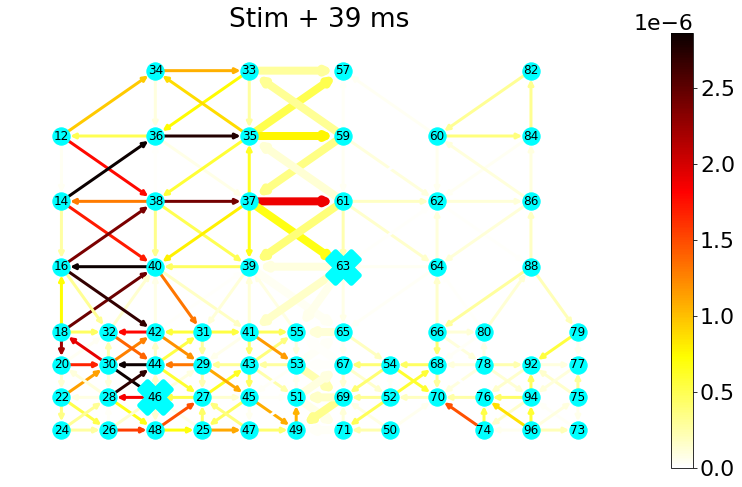

In [12]:
# create and play the animation
nf_anim = flow_loader.generate_animation(flow_mtx_single)

ani = animation.FuncAnimation(nf_anim.fig, nf_anim.animate, np.shape(flow_mtx_single)[1], interval=500)
from IPython.display import HTML
HTML(ani.to_jshtml())

Now compute and play the average flow during stimulation of the entire session

In [13]:
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'
session = "MonkeyG_20150908_Session2_M1" # the session

block_ids = [1,2,3,4,5] # numbers of conditioning blocks
total_iter_cnt = 0 # counter for total number of iterations

# iterate over all conditioning blocks
for block_id in block_ids:
    flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', block_id)

    # iterate over all trials
    num_fits = flow_loader.get_num_model_fits()
    for i in range(num_fits):
        if total_iter_cnt == 0:
            flow_mtx_avg = flow_loader.get_single_flow_mtx(i)
        else:
            flow_mtx_avg += flow_loader.get_single_flow_mtx(i)
        total_iter_cnt += 1

# compute average flow
flow_mtx_avg /= total_iter_cnt

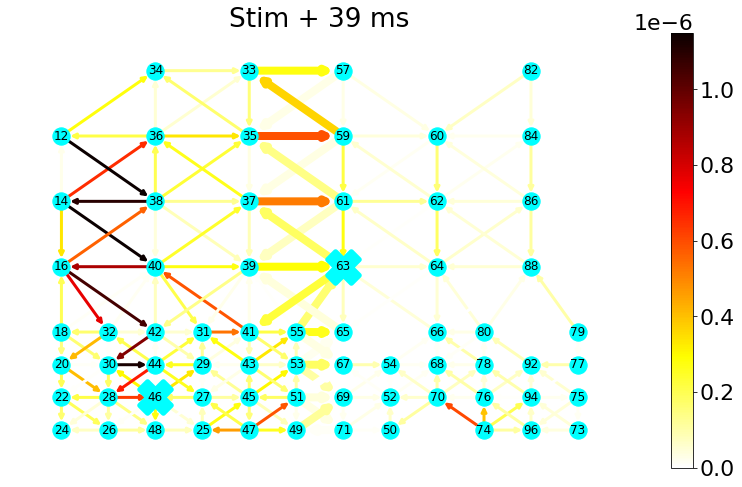

In [14]:
# create and play the animation
nf_anim = flow_loader.generate_animation(flow_mtx_avg)

ani = animation.FuncAnimation(nf_anim.fig, nf_anim.animate, np.shape(flow_mtx_single)[1], interval=500)
from IPython.display import HTML
HTML(ani.to_jshtml())

## Comparing distribution of flow across and within physiological regions

The distribution of the flow within the S1 (M1) region is the distribution obtained from **all** the flow across all edges that are completely within S1 (M1). It is not the distribution of the flow across a single edge. The across flow distribution is the distribution of the flow across all edges that connect S1 and M1

In [15]:
def kl_divergence(p, q):
    kl_div = p * np.log(p / q)
    idx_finite = np.isfinite(kl_div)
    return np.sum(kl_div[idx_finite])

In [16]:
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'
session = "MonkeyG_20150908_Session2_M1" # the session

block_id = 1 # numbers of conditioning blocks
flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', block_id)

# get indices of edges within S1, within M1, and across physiological boundary
idx_s1, idx_m1, idx_across = flow_loader.get_edge_affiliation()
num_fits = flow_loader.get_num_model_fits()

t_after_stim = 5 # time after first laser in milliseconds

# vectors to store the flow flow all trials
flow_s1 = np.array([])
flow_m1 = np.array([])
flow_across = np.array([])

# iterate over all trials. Only store the flow 5 milliseconds after the first laser stimulation
for i in range(num_fits):
    flow_mtx_single = flow_loader.get_single_flow_mtx(i)
    flow_s1 = np.concatenate([flow_s1, flow_mtx_single[idx_s1,t_after_stim]])
    flow_m1 = np.concatenate([flow_m1, flow_mtx_single[idx_m1,t_after_stim]])
    flow_across = np.concatenate([flow_across, flow_mtx_single[idx_across,t_after_stim]])

# compute the distribution for the S1, M1 and across flow
bin_edge_min = np.min([min(flow_s1), min(flow_m1), min(flow_across)])
bin_edge_max = np.max([max(flow_s1), max(flow_m1), max(flow_across)])

bin_edges = np.linspace(bin_edge_min, bin_edge_max, 1000)
hist_s1, _ = np.histogram(flow_s1, bins=bin_edges, density=True)
hist_m1, _ = np.histogram(flow_m1, bins=bin_edges, density=True)
hist_across, _ = np.histogram(flow_across, bins=bin_edges, density=True)

# compute KL divergences between all distributions
kl_s1_m1 = kl_divergence(hist_m1, hist_s1)
kl_s1_across = kl_divergence(hist_s1, hist_across)
kl_m1_across = kl_divergence(hist_m1, hist_across)

print(f'KL divergence S1 - M1: {kl_s1_m1}')
print(f'KL divergence S1 - across: {kl_s1_across}')
print(f'KL divergence M1 - across: {kl_m1_across}')

KL divergence S1 - M1: 907725.7338313758
KL divergence S1 - across: 65685.06113153716
KL divergence M1 - across: 586247.9070759397


/var/folders/47/6bv9971j1vzcfw27td98yc380000gn/T/ipykernel_19315/1032146672.py:2: RuntimeWarning: divide by zero encountered in true_divide
  kl_div = p * np.log(p / q)
/var/folders/47/6bv9971j1vzcfw27td98yc380000gn/T/ipykernel_19315/1032146672.py:2: RuntimeWarning: invalid value encountered in true_divide
  kl_div = p * np.log(p / q)
/var/folders/47/6bv9971j1vzcfw27td98yc380000gn/T/ipykernel_19315/1032146672.py:2: RuntimeWarning: divide by zero encountered in log
  kl_div = p * np.log(p / q)
/var/folders/47/6bv9971j1vzcfw27td98yc380000gn/T/ipykernel_19315/1032146672.py:2: RuntimeWarning: invalid value encountered in multiply
  kl_div = p * np.log(p / q)


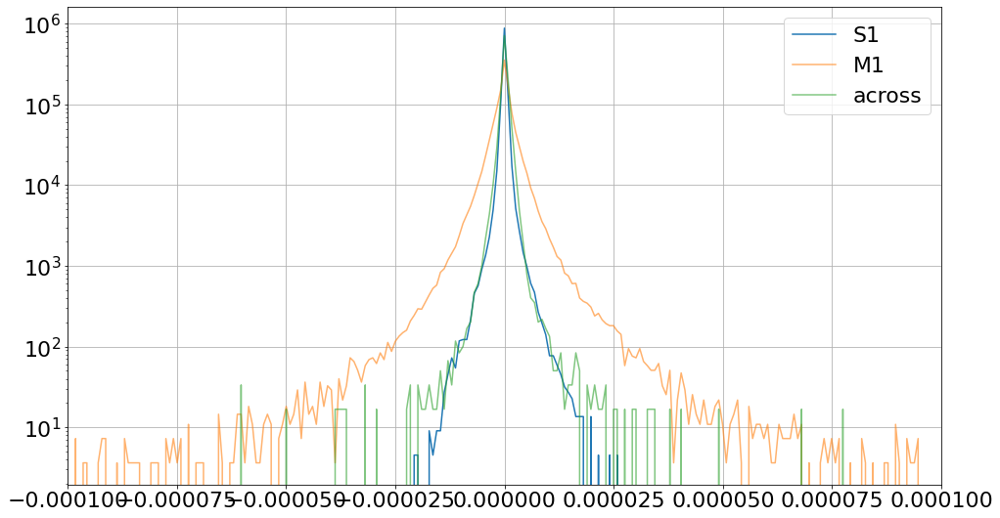

In [17]:
# plot histograms of flow distributions
fig, ax = plt.subplots(figsize=(16,9))
plt.plot(0.5*(bin_edges[1:] + bin_edges[:-1]), hist_s1, label='S1')
plt.plot(0.5*(bin_edges[1:] + bin_edges[:-1]), hist_m1, alpha=0.6, label='M1')
plt.plot(0.5*(bin_edges[1:] + bin_edges[:-1]), hist_across, alpha=0.6, label='across')
plt.yscale('log')
plt.xlim(-1e-4, 1e-4)
plt.legend()
plt.grid()
plt.show()

### Task 1 (Statistical analysis of Flow):
* compute KL divergence as defined above for all blocks and all sessions
* plot histograms for all sessions and look for patterns

### Task 2 (Clustering of Flow):
* take entire flow signal (start with an average or single snapshot at the beginning and later extend to entire time varying flow) from differnt blocks of same session and perform clustering.
* do data from recording (conditioning) block cluster together and are separated from the other block type?

### Task 3 (Flow decomposition):
* Combining using PCA or related techniques to decompose the flow signals into different components
* compare the components across blocks and sessions

### Task 4 (Analyze flow time series):
* Analyze time series of edges. Look for number and location of peaks, oscillation patterns, etc.
* could compute fourier transforms of time series

# Other Tasks:

### Task 1 (may not be feasible yet):
* take entire flow signal (start with an average or single snapshot at the beginning and later extend to entire time varying flow) form two (later more) sessions and perform clustering.
* Do separate clusters form for differnt sessions
* if we consider more then 2 sessions, do sessions with similar stimulation protocol cluster together
(Comparing different sessions is challenging, since the length of the flow vectors differ between sessions

### Task 2 (Learning Flow Model or Flow Signal):
* using neural nets to learn the parameters of the flow generating model
* this can be phased as a supervised learning problem.
* Would require some background in machine learning and/or deep learning. Probably also requires using tensorflow or pytorch
* this problem might be similar to the concepts of auto encoders or GANs

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
%matplotlib inline

In [10]:
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'
session = "MonkeyG_20150908_Session2_M1" # the session

block_ids = [1,2,3,4,5] # numbers of conditioning blocks
total_iter_cnt = 0 # counter for total number of iterations

# iterate over all conditioning blocks
for block_id in block_ids:
    flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', block_id)

    # iterate over all trials
    num_fits = flow_loader.get_num_model_fits()
    for i in range(num_fits):
        if total_iter_cnt == 0:
            flow_mtx_avg1 = flow_loader.get_single_flow_mtx(i)
        else:
            flow_mtx_avg1 += flow_loader.get_single_flow_mtx(i)
        total_iter_cnt += 1

# compute average flow
flow_mtx_avg1 /= total_iter_cnt

print(flow_mtx_avg1)

[[ 1.22908049e-07 -2.34389088e-08 -2.88912911e-07 ...  1.17193828e-07
   1.30938570e-07  1.47986914e-07]
 [ 2.62669441e-07  3.92496671e-07  5.20873257e-07 ...  1.83369511e-07
   1.71352212e-07  1.63121777e-07]
 [-1.45646760e-07 -2.39462503e-07 -3.03172017e-07 ... -1.91077445e-07
  -1.77894143e-07 -1.66203384e-07]
 ...
 [-1.97443794e-08 -2.44824279e-08 -2.74151795e-08 ... -7.22449354e-09
  -3.50799756e-09 -7.55105854e-10]
 [ 4.87359217e-08  5.12636335e-08  5.10615527e-08 ...  7.36232688e-08
   8.96001296e-08  1.00322148e-07]
 [ 1.51891268e-08  1.66888577e-08  8.90735047e-09 ...  5.11452540e-08
   3.81363994e-08  2.70583810e-08]]


In [12]:
base_path_model = "/Users/yuhaozhuang/Desktop/Neural Flow/diffusion_model_v2_lp/" # this the fitted model parameter for all sessions stored
base_path_ecog = '/Users/yuhaozhuang/Desktop/Neural Flow/ECoG_data'
session = "MonkeyG_20150910_Session6_S1" # the session

block_ids = [1,2,3,4,5] # numbers of conditioning blocks
total_iter_cnt = 0 # counter for total number of iterations

# iterate over all conditioning blocks
for block_id in block_ids:
    flow_loader = FlowLoader(base_path_model, base_path_ecog, session, 'cond', block_id)

    # iterate over all trials
    num_fits = flow_loader.get_num_model_fits()
    for i in range(num_fits):
        if total_iter_cnt == 0:
            flow_mtx_avg2 = flow_loader.get_single_flow_mtx(i)
        else:
            flow_mtx_avg2 += flow_loader.get_single_flow_mtx(i)
        total_iter_cnt += 1

# compute average flow
flow_mtx_avg2 /= total_iter_cnt

print(flow_mtx_avg2)

[[-2.70393233e-08 -3.51502666e-08 -4.77064293e-08 ...  2.23085812e-07
   2.19001385e-07  2.15974226e-07]
 [ 1.72803124e-07  1.72704026e-07  1.74857528e-07 ...  1.85816852e-07
   1.88077660e-07  1.89597098e-07]
 [ 6.31590410e-08  6.47744667e-08  6.38992700e-08 ... -8.06138757e-09
  -1.65607119e-09  3.07285180e-09]
 ...
 [ 1.06327563e-07  1.11094120e-07  1.12212187e-07 ...  1.31080026e-07
   1.31999269e-07  1.31751032e-07]
 [ 4.34752275e-08  4.74055921e-08  5.39892274e-08 ... -4.59369021e-09
  -5.42628709e-09 -5.97183897e-09]
 [ 8.34403659e-08  8.33058907e-08  8.51533023e-08 ...  9.50908533e-08
   9.81475555e-08  9.96056670e-08]]


In [13]:
# Merge the neural flow data for session M1 and S1
flow_mtx_avg_M1_S1 = np.concatenate((flow_mtx_avg1, flow_mtx_avg2))

/Users/yuhaozhuang/opt/anaconda3/envs/research/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/yuhaozhuang/opt/anaconda3/envs/research/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 499 samples in 0.001s...
[t-SNE] Computed neighbors for 499 samples in 0.053s...
[t-SNE] Computed conditional probabilities for sample 499 / 499
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.781509
[t-SNE] KL divergence after 1000 iterations: 0.535988


[Text(0.5, 1.0, ' flow_mtx_avg_M1_S1 T-SNE projection')]

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


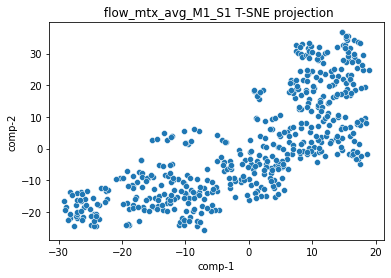

In [14]:
# Visulizing using t-SNE
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, random_state=123) # two dimensions
z = tsne.fit_transform(flow_mtx_avg_M1_S1)
df = pd.DataFrame()
df["comp-1"] = z[:,0]
df["comp-2"] = z[:,1]
sns.scatterplot(x="comp-1", y="comp-2", data=df).set(title=" flow_mtx_avg_M1_S1 T-SNE projection") 


In [15]:
from sklearn.decomposition import PCA
# Use PCA to decrease dimension to 2-D
pca = PCA(n_components=2)
pca_M1 = pca.fit_transform(flow_mtx_avg1)
pca_S1 = pca.fit_transform(flow_mtx_avg2)

principalDf_M1 = pd.DataFrame(data = pca_M1
             , columns = ['principal component 1', 'principal component 2'])
principalDf_S1 = pd.DataFrame(data = pca_S1
             , columns = ['principal component 1', 'principal component 2'])

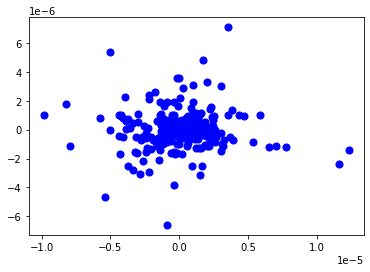

In [16]:
# Merge the 2-D data for session M1 and S1
principal_M1_S1 = np.concatenate((principalDf_M1, principalDf_S1))
# Plot the 2-D merged data
plt.scatter(principal_M1_S1[ : , 0], principal_M1_S1[ :, 1], s = 50, c = 'b')

In [17]:
Kmean = KMeans(n_clusters=2)
Kmean.fit(principal_M1_S1)
Kmean.cluster_centers_

array([[-5.18850561e-07, -2.71564141e-08],
       [ 2.52710744e-06,  1.32267711e-07]])

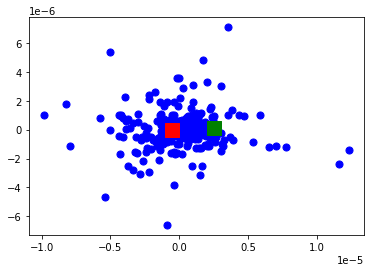

In [18]:
# Plot the centers of two clusters
plt.scatter(principal_M1_S1[ : , 0], principal_M1_S1[ : , 1], s =50, c='b')
plt.scatter(2.52710744e-06, 1.32267711e-07, s=200, c='g', marker='s')
plt.scatter(-5.18850561e-07,  -2.71564141e-08, s=200, c='r', marker='s')
plt.show()

In [19]:
Kmean = KMeans(n_clusters=1)
Kmean.fit(principal_M1_S1)
Kmean.cluster_centers_

array([[6.10024981e-23, 2.24913558e-23]])

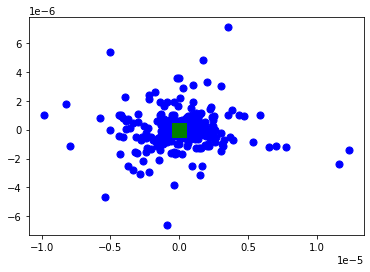

In [21]:
# Plot the center of the data with only one cluster
plt.scatter(principal_M1_S1[ : , 0], principal_M1_S1[ : , 1], s =50, c='b')
plt.scatter(6.10024981e-23, 2.24913558e-23, s=200, c='g', marker='s')
plt.show()